In [2]:
DATA_DIR_BASE = "data"


import math

from IPython.display import display, Markdown
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import scipy.ndimage
import skimage.feature
import skimage.io
import skimage.transform

import fns

run_names, bg_paths, fg_pathses, gt_data = fns.load_all(
    data_dir_base=DATA_DIR_BASE)

In [3]:
import importlib

import preprocessing


importlib.reload(preprocessing)

<module 'preprocessing' from '/Users/jenny.vophamhi/Desktop/CZB/others/from_greg/2021-07-15 sw counts vs gt vis 20210913/preprocessing.py'>

# Data dir summary

In [4]:
num_fg_paths = 0
num_fg_matched = 0
all_fg_paths = {} # List of FG image paths per run name
for run_name in run_names:
    all_fg_paths[run_name] = [
       x for lane_no in fg_pathses[run_name]
       for x in fg_pathses[run_name][lane_no]]
    num_fg_paths += len(all_fg_paths[run_name])

for run_name in run_names:
    print(f"Run {run_name}:")
    print(f"  BG Lanes:        {','.join(str(x) for x in bg_paths[run_name])}")
    print(f"  Num FG images:   {len(all_fg_paths[run_name])}")
    n_matched = sum(len(x) for x in gt_data[run_name].values()) \
                if run_name in gt_data else 0
    num_fg_matched += n_matched
    print(f"  Num matched GTs: {n_matched}")

unm_gt_ids = ()
if None in gt_data:
    print()
    print("Unmatched GTs:")
    unm_gt_ids = [
        f"  {ts}-{lane_no}"
        for lane_no in gt_data[None]
        for ts in gt_data[None][lane_no]]
    print("\n".join(unm_gt_ids))

print()
print(f"Total FG images:        {num_fg_paths}")
print(f"Total GT files:         {num_fg_matched + len(unm_gt_ids)}")
print(f"Total matched GT files: {num_fg_matched}")

Run 20201217:
  BG Lanes:        5,4,6,7,3,2,0,1
  Num FG images:   8
  Num matched GTs: 4
Run 20201216:
  BG Lanes:        5,4,6,7,3,2,0,1
  Num FG images:   40
  Num matched GTs: 10
Run 20200901:
  BG Lanes:        0,1,3,2,6,7,5,4
  Num FG images:   32
  Num matched GTs: 16
Run 20200916b:
  BG Lanes:        6,7,5,4,0,1,3,2
  Num FG images:   24
  Num matched GTs: 5
Run 20200916a:
  BG Lanes:        5,4,6,7,3,2,0,1
  Num FG images:   16
  Num matched GTs: 5

Unmatched GTs:
  20201002-150536-6
  20201002-132522-6
  20201002-135404-6
  20201002-142245-6
  20201002-140824-4
  20201002-150536-4
  20201002-131101-4
  20201002-132522-4
  20201002-135404-4
  20201002-133942-4
  20201002-145125-4
  20201002-125630-4
  20201002-142245-4
  20201002-131101-2
  20201002-132522-2
  20201002-140824-2
  20201002-135404-2
  20201002-133942-2
  20201002-142245-2
  20201002-125630-2
  20201002-132522-3
  20201002-131101-3
  20201002-135404-3
  20201002-145125-3
  20201002-133942-3
  20201002-142245-3
 

# GT visualization

In [9]:
DOWNSAMPLE_FACTOR = 2
KERNEL_SIZE = 150
DISC_RADIUS = 3

def crop_image(img):
    ycrop = int((2048-948)/2)
    xcrop = int((2448-1948)/2)
    return img[ycrop:-1*ycrop,xcrop:-1*xcrop]

def cross_correlate(img, kernel):
    cc_img = skimage.feature.match_template(img, kernel, pad_input=True)
    cc_img[cc_img < 0.] = 0.
    return cc_img

def get_kernel():
    kernel = np.zeros((KERNEL_SIZE, KERNEL_SIZE), 'uint16')
    kernelCtr = KERNEL_SIZE / 2
    for rr in range(0, KERNEL_SIZE + 1):
        for cc in range(0, KERNEL_SIZE + 1):
            if  math.sqrt((rr - kernelCtr)**2 + (cc - kernelCtr)**2) < DISC_RADIUS:
                kernel[rr, cc] = 65535
    return skimage.transform.downscale_local_mean(
        kernel, (DOWNSAMPLE_FACTOR,DOWNSAMPLE_FACTOR))

def find_blobs(cc_img):
    return skimage.feature.blob_dog(
        cc_img, min_sigma=5, max_sigma=15, threshold=0.08, overlap=0.8)

kernel = get_kernel()

# Observations

Greg: "We want the excluded area just big enough to avoid any areas where the blob dog method miscounts due to weird illumination of the cells (1) but without throwing away too much usable image area (2)."



![gc_bubble_example](gc_bubble_example.png)

Here we see that for this image, `cleanup_fg_grow_factor` = 0, which is the lowest setting, gives the results closest to what we want. 

The value we have been using up till now has been `cleanup_fg_grow_factor` = 0.01.

## Run: `20201217`

### Lane 2

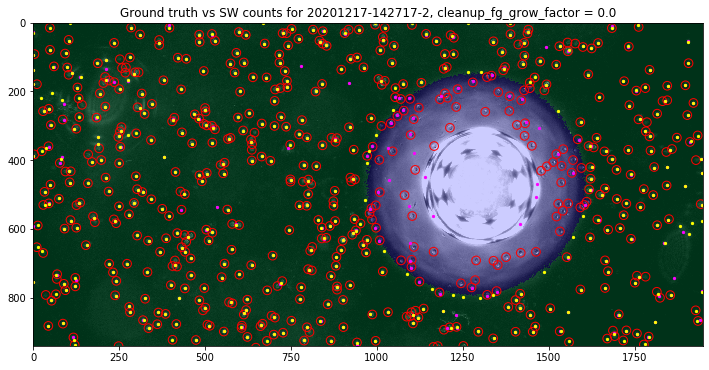

gt_xs:	 568
xs:	 457
pp_xs:	 453


## Run: `20201217`

### Lane 2

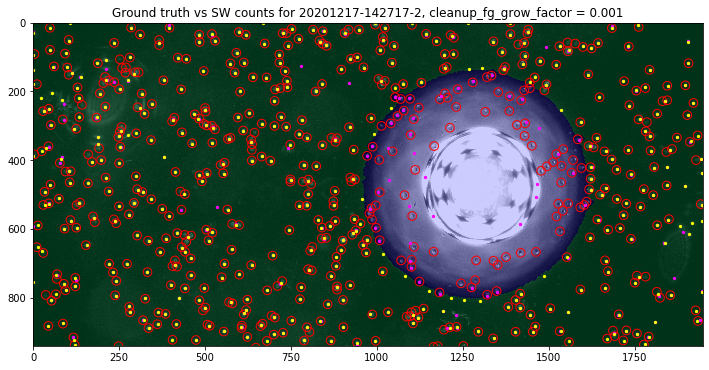

gt_xs:	 568
xs:	 457
pp_xs:	 448


## Run: `20201217`

### Lane 2

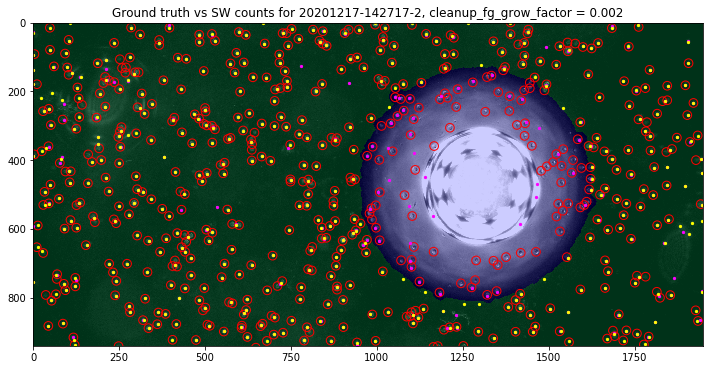

gt_xs:	 568
xs:	 457
pp_xs:	 441


## Run: `20201217`

### Lane 2

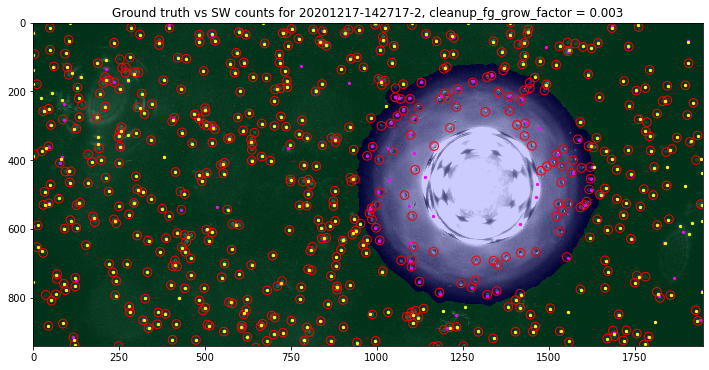

gt_xs:	 568
xs:	 457
pp_xs:	 431


## Run: `20201217`

### Lane 2

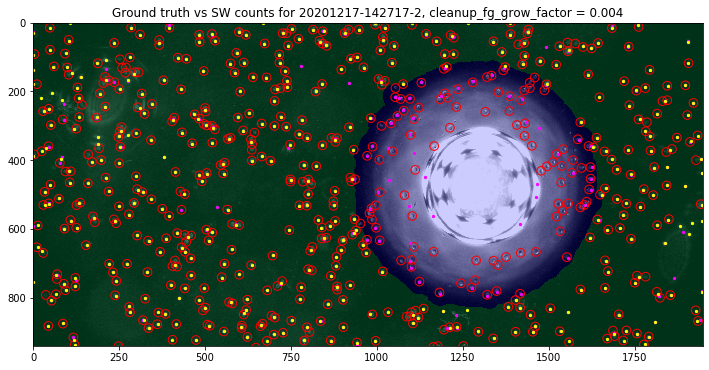

gt_xs:	 568
xs:	 457
pp_xs:	 425


## Run: `20201217`

### Lane 2

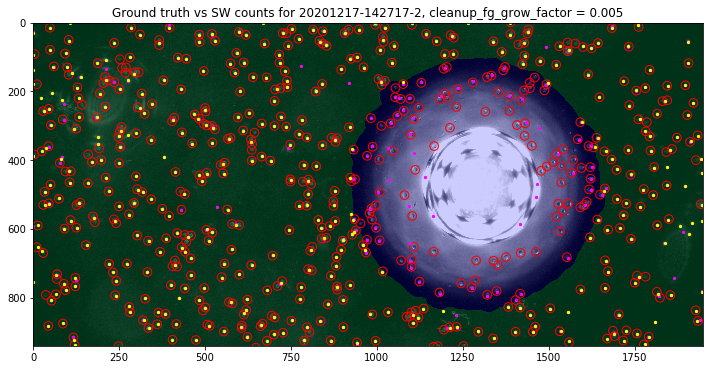

gt_xs:	 568
xs:	 457
pp_xs:	 420


## Run: `20201217`

### Lane 2

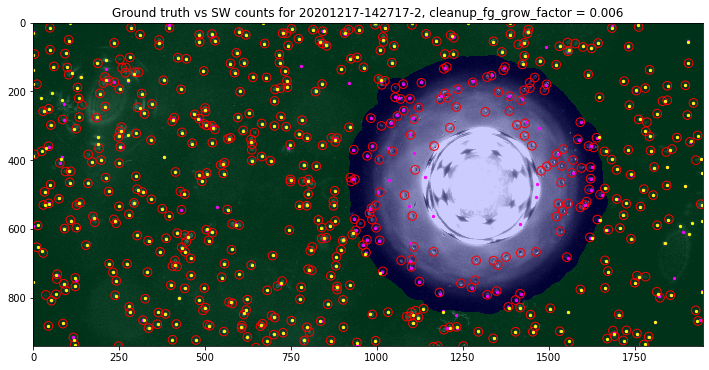

gt_xs:	 568
xs:	 457
pp_xs:	 410


## Run: `20201217`

### Lane 2

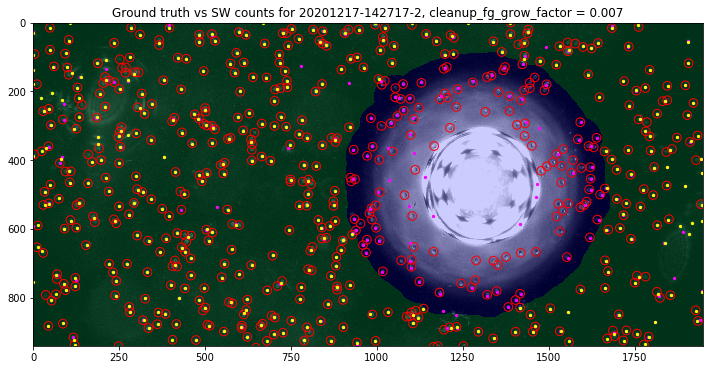

gt_xs:	 568
xs:	 457
pp_xs:	 402


## Run: `20201217`

### Lane 2

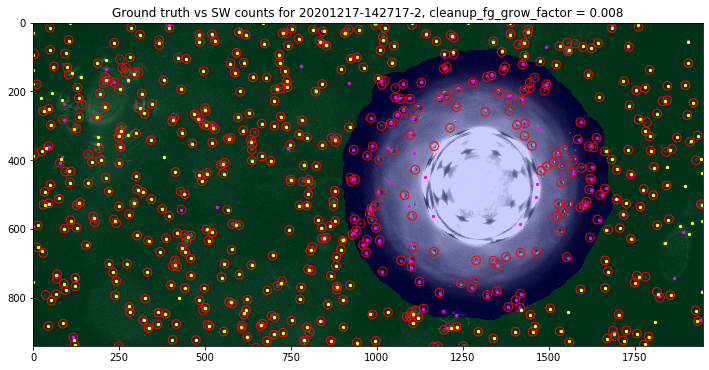

gt_xs:	 568
xs:	 457
pp_xs:	 399


## Run: `20201217`

### Lane 2

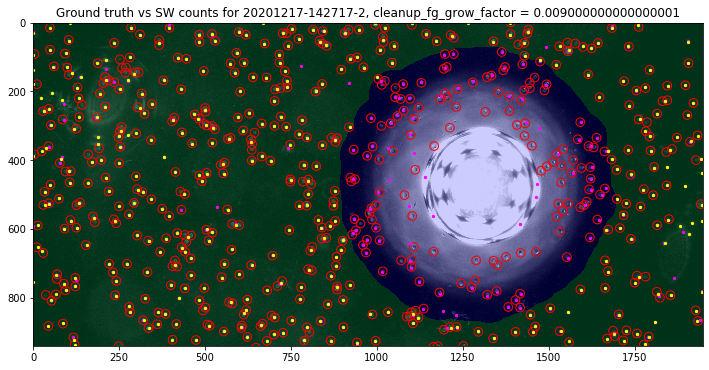

gt_xs:	 568
xs:	 457
pp_xs:	 395


In [30]:
for gf in np.arange(0, 0.01, 0.001):

    pp_params = {
        "input_rescale_factor":   None,
        "input_gaussian_sigma":   None,
        "align_bg_pixel_thresh":  0.25,
        "align_bg_row_thresh":    0.35,
        "align_mask_margin":      0.01,
        "align_cutout_height":    0.75,
        "align_oversub_factor":   1.05,
        "cleanup_wall_margin":    0.05,
        "cleanup_bg_brt_thresh":  0.25,
        "cleanup_bg_grow_factor": 1.0e-2,
        "cleanup_fg_brt_thresh":  0.05,
        "cleanup_fg_grow_factor": gf,
        "cleanup_fg_grow_cycles": 4,
        "cleanup_fg_size_thresh": 3.0e-4,
        "cleanup_gaussian_sigma": None,
    }

    gt_xs_list, xs_list, pp_xs_list = [], [], []
    run_name_list, lane_no_list, ts_list = [], [], []

    #for run_name in run_names:
    for run_name in ['20201217']:
        if run_name not in gt_data:
            continue
        display(Markdown(f'## Run: `{run_name}`'))
    #     for lane_no in sorted(gt_data[run_name].keys()):
        for lane_no in [2]:
            pp = preprocessing.Cci1ImagePreprocessing(**pp_params)
            pp.set_bg_image_from_path(bg_paths[run_name][lane_no])
            display(Markdown(f'### Lane {lane_no}'))
            for ts in sorted(gt_data[run_name][lane_no].keys()):
                plt.figure(figsize=(12.,12.))

                pp_img, valid_area, info = pp.process_fg_image_from_path(
                    fg_pathses[run_name][lane_no][ts])

                pp_cc_img = cross_correlate(crop_image(pp_img), kernel)
                pp_ys, pp_xs, pp_sigmas = zip(*(find_blobs(pp_cc_img)))

                cc_img = cross_correlate(crop_image(info["fg_image"]), kernel)
                ys, xs, sigmas = zip(*(find_blobs(cc_img)))
                ys += info["shift"][0]
                xs += info["shift"][1]

                gt_ys, gt_xs = zip(*gt_data[run_name][lane_no][ts])
                gt_ys += info["shift"][0]
                gt_xs += info["shift"][1]

                # Shift image and compress dynamic range for display; mask also
                disp_img = scipy.ndimage.shift(
                    crop_image(info["fg_image"]) ** 0.5, info["shift"])
                plt.imshow(disp_img, cmap=plt.cm.gray, vmin=0.3, vmax=1.)
                disp_mask = scipy.ndimage.shift(
                    crop_image(info["fg_feature_mask"]) ** 0.5, info["shift"])
                plt.imshow(disp_mask, cmap='winter', alpha=0.2)

                plt.scatter(gt_xs, gt_ys, s=75., facecolors='none', edgecolors='red')
                plt.scatter(xs, ys, s=5., facecolors='magenta')
                plt.scatter(pp_xs, pp_ys, s=5., facecolors='yellow')

                plt.title(f"Ground truth vs SW counts for {ts}-{lane_no}, cleanup_fg_grow_factor = {gf}")
                plt.xlim(0, 1948)
                plt.ylim(940, 0)
                plt.show()

                gt_xs_list.append(len(gt_xs))
                xs_list.append(len(xs))
                pp_xs_list.append(len(pp_xs))
                run_name_list.append(run_name)
                lane_no_list.append(lane_no)
                ts_list.append(ts)

                print('gt_xs:\t', len(gt_xs))
                print('xs:\t', len(xs))
                print('pp_xs:\t', len(pp_xs))


# Observations

Here we check that `cleanup_fg_grow_factor` = 0 gives good results on all the images in this dataset that have large foreground bright spots (like bubbles and other aberrations).

Sometimes there is still too much or too little valid area in an image.

E.g. Run 20201216:
- Lane 1: too much "valid" (green) area. After cci1pp and cross-correlation, we detected those blobs (yellow markers) along the edge of the invalid area. This could be addressed by increasing `cleanup_fg_grow_factor`.
- Lane 2: not enough "valid" (green) area. After cci1pp and cross-correlation, we id not detect those blobs in the dark part of the "invalid" (blue) area. This cannot be addressed by shrinking `cleanup_fg_grow_factor`, which is already 0, any further. (I got a KeyError when I tried to use negaative `cleanup_fg_grow_factor` values.)

Overall, `cleanup_fg_grow_factor` = 0 gives good results.

## Run: `20201217`

### Lane 0

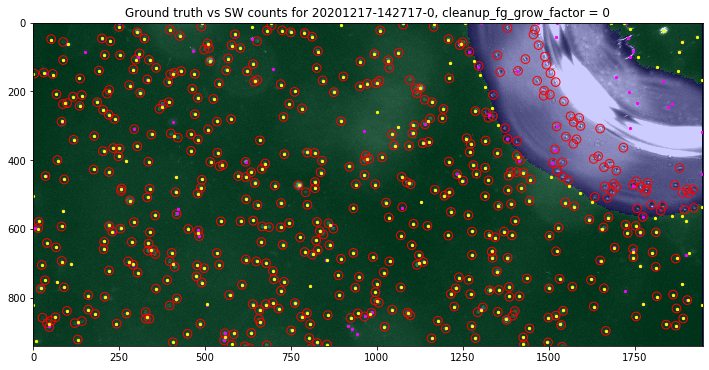

gt_xs:	 519
xs:	 443
pp_xs:	 446


### Lane 2

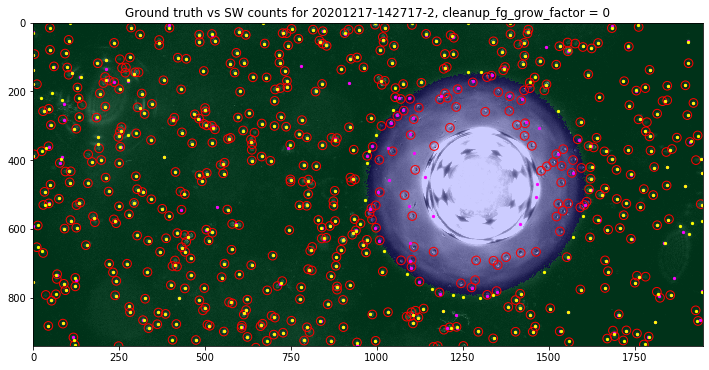

gt_xs:	 568
xs:	 457
pp_xs:	 453


### Lane 5

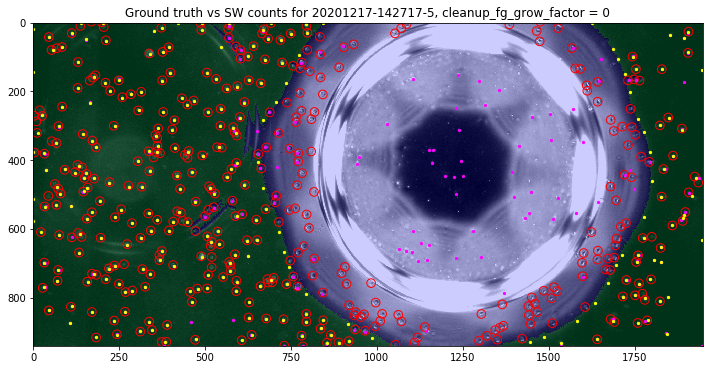

gt_xs:	 410
xs:	 320
pp_xs:	 287


## Run: `20201216`

### Lane 1

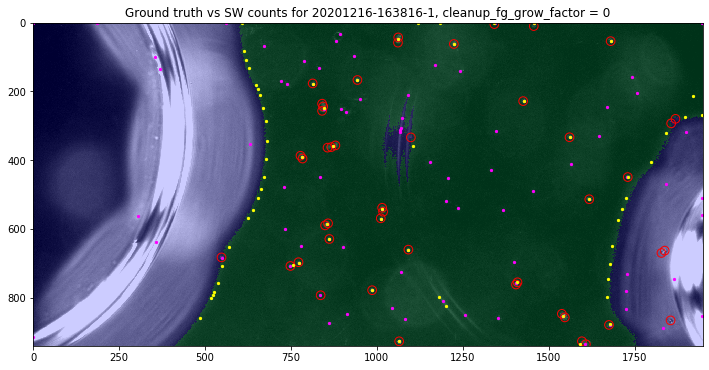

gt_xs:	 46
xs:	 96
pp_xs:	 72


### Lane 2

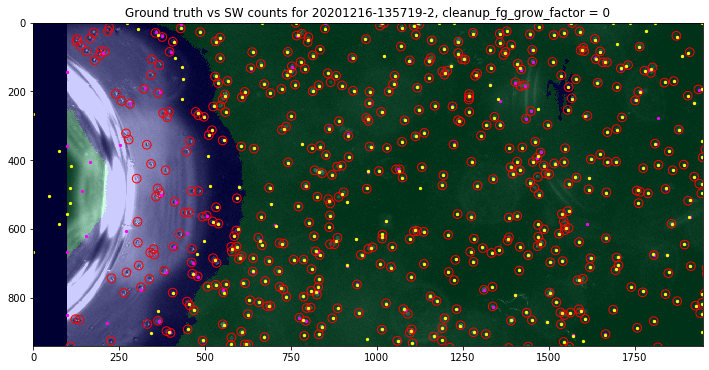

gt_xs:	 514
xs:	 427
pp_xs:	 437


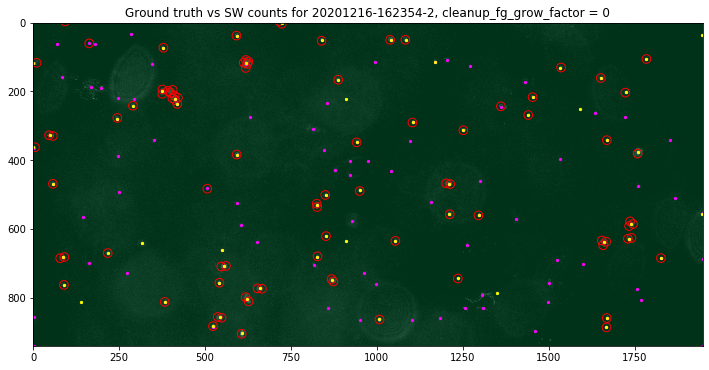

gt_xs:	 88
xs:	 130
pp_xs:	 68


### Lane 5

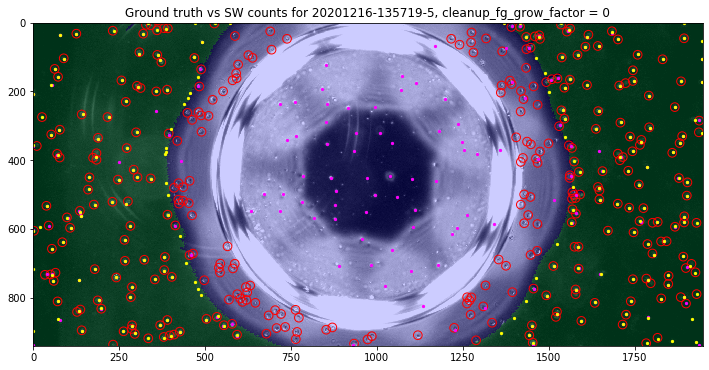

gt_xs:	 332
xs:	 261
pp_xs:	 230


### Lane 7

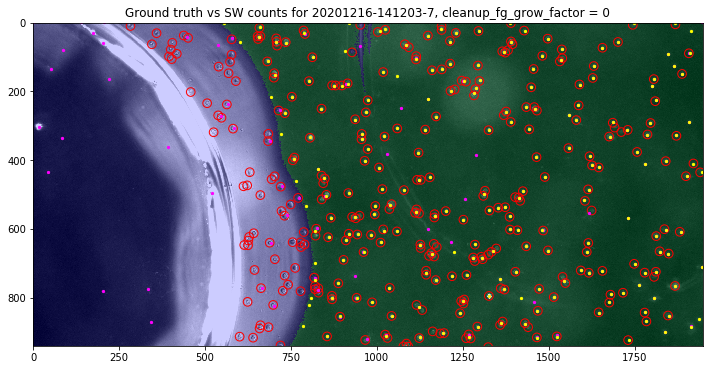

gt_xs:	 331
xs:	 252
pp_xs:	 233


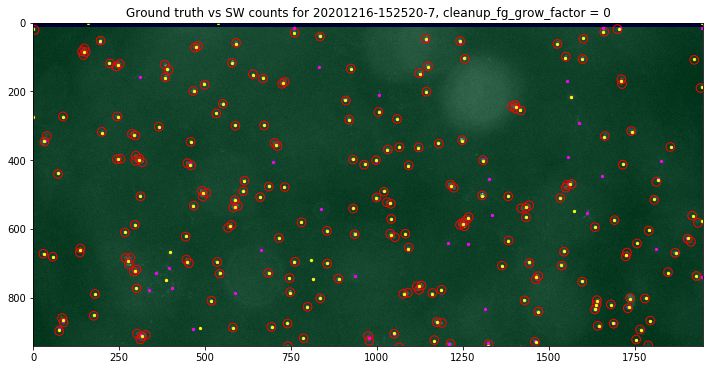

gt_xs:	 230
xs:	 205
pp_xs:	 190


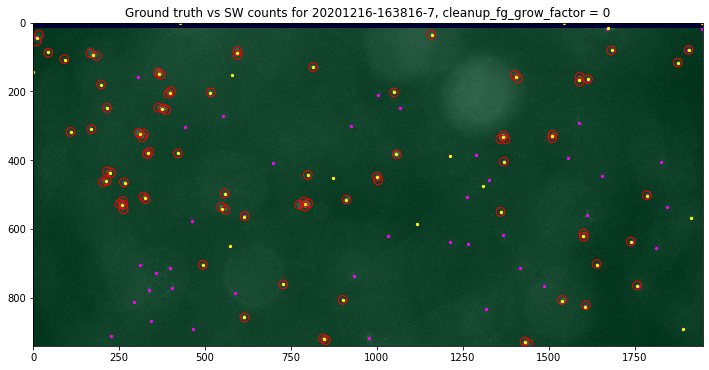

gt_xs:	 84
xs:	 99
pp_xs:	 68


## Run: `20200901`

### Lane 0

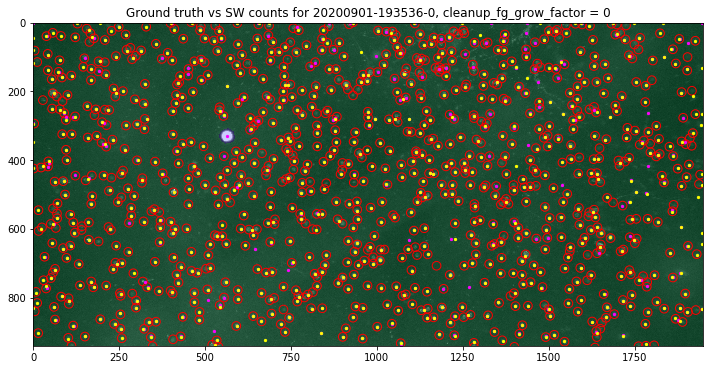

gt_xs:	 977
xs:	 770
pp_xs:	 788


### Lane 2

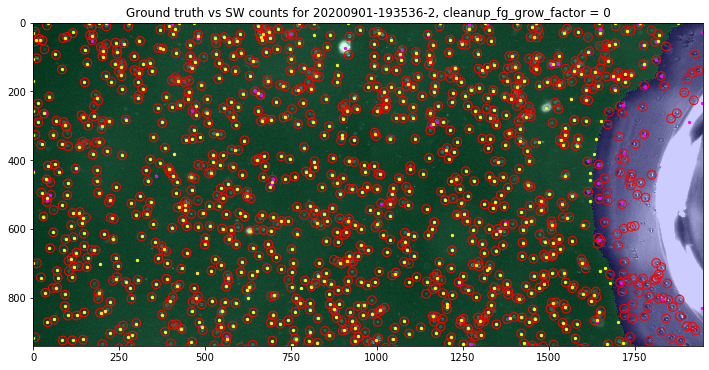

gt_xs:	 1135
xs:	 753
pp_xs:	 791


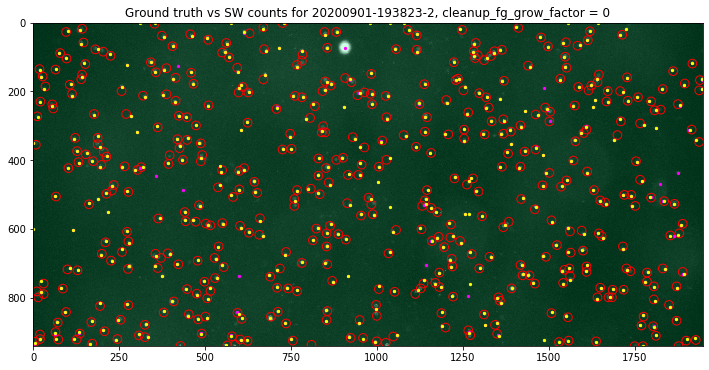

gt_xs:	 460
xs:	 437
pp_xs:	 465


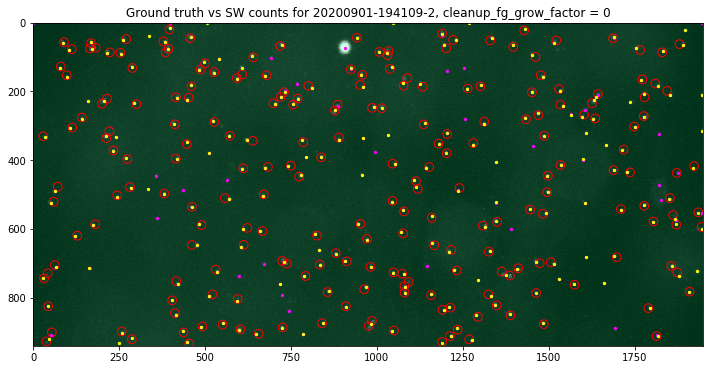

gt_xs:	 224
xs:	 261
pp_xs:	 250


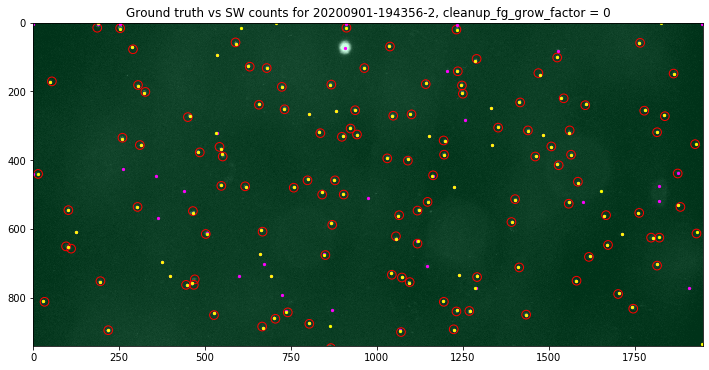

gt_xs:	 120
xs:	 154
pp_xs:	 142


## Run: `20200916b`

### Lane 6

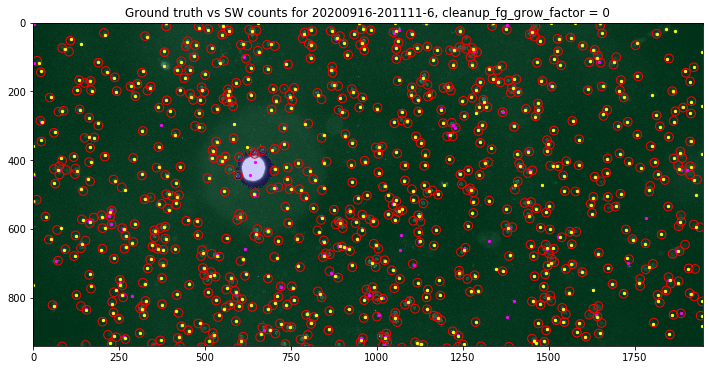

gt_xs:	 756
xs:	 594
pp_xs:	 614


### Lane 7

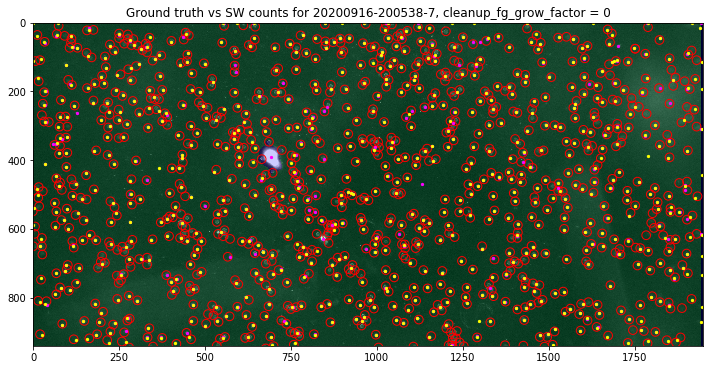

gt_xs:	 1010
xs:	 708
pp_xs:	 749


## Run: `20200916a`

### Lane 4

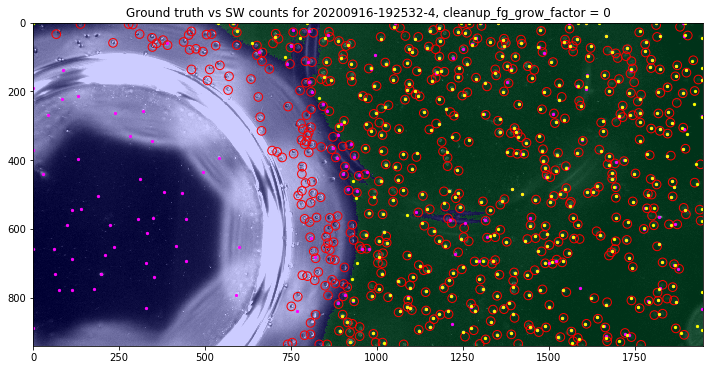

gt_xs:	 579
xs:	 445
pp_xs:	 393


In [31]:
gf = 0

pp_params = {
    "input_rescale_factor":   None,
    "input_gaussian_sigma":   None,
    "align_bg_pixel_thresh":  0.25,
    "align_bg_row_thresh":    0.35,
    "align_mask_margin":      0.01,
    "align_cutout_height":    0.75,
    "align_oversub_factor":   1.05,
    "cleanup_wall_margin":    0.05,
    "cleanup_bg_brt_thresh":  0.25,
    "cleanup_bg_grow_factor": 1.0e-2,
    "cleanup_fg_brt_thresh":  0.05,
    "cleanup_fg_grow_factor": gf,
    "cleanup_fg_grow_cycles": 4,
    "cleanup_fg_size_thresh": 3.0e-4,
    "cleanup_gaussian_sigma": None,
}

bubble_images = {
    '20201217': [0, 2, 5],
    '20201216': [1, 2, 5, 7],
    '20200901': [0, 2],
    '20200916b': [6, 7],
    '20200916a': [4]
}

gt_xs_list, xs_list, pp_xs_list = [], [], []
run_name_list, lane_no_list, ts_list = [], [], []

#for run_name in run_names:
for run_name in bubble_images.keys():
    if run_name not in gt_data:
        continue
    display(Markdown(f'## Run: `{run_name}`'))
#     for lane_no in sorted(gt_data[run_name].keys()):
    for lane_no in bubble_images[run_name]:
        pp = preprocessing.Cci1ImagePreprocessing(**pp_params)
        pp.set_bg_image_from_path(bg_paths[run_name][lane_no])
        display(Markdown(f'### Lane {lane_no}'))
        for ts in sorted(gt_data[run_name][lane_no].keys()):
            plt.figure(figsize=(12.,12.))

            pp_img, valid_area, info = pp.process_fg_image_from_path(
                fg_pathses[run_name][lane_no][ts])

            pp_cc_img = cross_correlate(crop_image(pp_img), kernel)
            pp_ys, pp_xs, pp_sigmas = zip(*(find_blobs(pp_cc_img)))

            cc_img = cross_correlate(crop_image(info["fg_image"]), kernel)
            ys, xs, sigmas = zip(*(find_blobs(cc_img)))
            ys += info["shift"][0]
            xs += info["shift"][1]

            gt_ys, gt_xs = zip(*gt_data[run_name][lane_no][ts])
            gt_ys += info["shift"][0]
            gt_xs += info["shift"][1]

            # Shift image and compress dynamic range for display; mask also
            disp_img = scipy.ndimage.shift(
                crop_image(info["fg_image"]) ** 0.5, info["shift"])
            plt.imshow(disp_img, cmap=plt.cm.gray, vmin=0.3, vmax=1.)
            disp_mask = scipy.ndimage.shift(
                crop_image(info["fg_feature_mask"]) ** 0.5, info["shift"])
            plt.imshow(disp_mask, cmap='winter', alpha=0.2)

            plt.scatter(gt_xs, gt_ys, s=75., facecolors='none', edgecolors='red')
            plt.scatter(xs, ys, s=5., facecolors='magenta')
            plt.scatter(pp_xs, pp_ys, s=5., facecolors='yellow')

            plt.title(f"Ground truth vs SW counts for {ts}-{lane_no}, cleanup_fg_grow_factor = {gf}")
            plt.xlim(0, 1948)
            plt.ylim(940, 0)
            plt.show()

            gt_xs_list.append(len(gt_xs))
            xs_list.append(len(xs))
            pp_xs_list.append(len(pp_xs))
            run_name_list.append(run_name)
            lane_no_list.append(lane_no)
            ts_list.append(ts)

            print('gt_xs:\t', len(gt_xs))
            print('xs:\t', len(xs))
            print('pp_xs:\t', len(pp_xs))


# Sandbox

Playing around with plotting mask over image

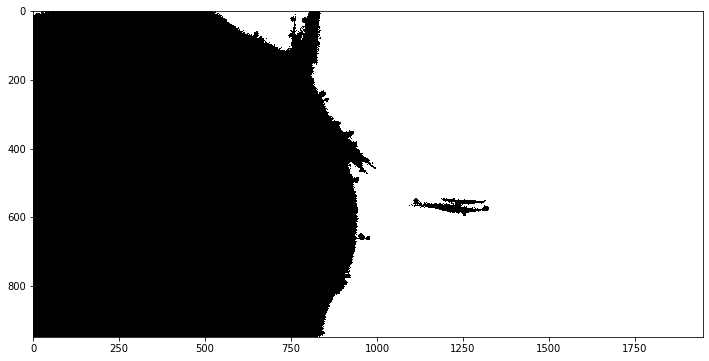

In [32]:
plt.figure(figsize=(12.,12.))
disp_mask = scipy.ndimage.shift(crop_image(info["fg_feature_mask"]) ** 0.5, info["shift"])
plt.imshow(disp_mask, cmap=plt.cm.gray, vmin=0.3, vmax=1.)
plt.show()

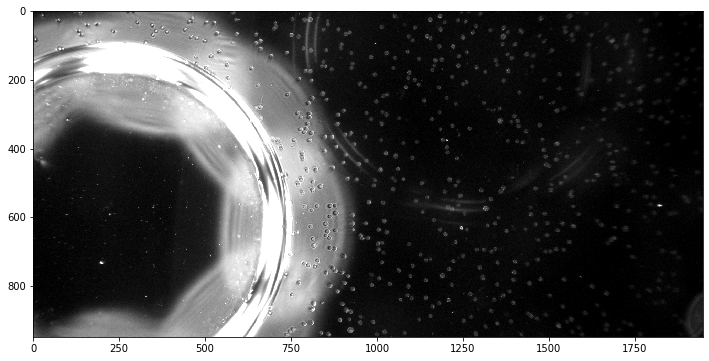

In [33]:
plt.figure(figsize=(12.,12.))
disp_img = scipy.ndimage.shift(crop_image(info["fg_image"]) ** 0.5, info["shift"])
plt.imshow(disp_img, cmap=plt.cm.gray, vmin=0.3, vmax=1.)
plt.show()

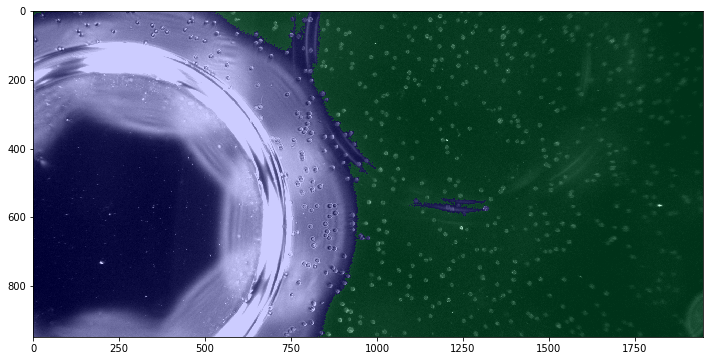

In [34]:
plt.figure(figsize=(12.,12.))
plt.imshow(disp_img, cmap=plt.cm.gray, vmin=0.3, vmax=1.)
plt.imshow(disp_mask, cmap='winter', alpha=0.2)
plt.show()

In [35]:
valid_area = disp_mask.sum()
total_area = disp_mask.shape[0] * disp_mask.shape[1]

In [36]:
valid_area/total_area

0.5498168629081868